In [2]:
%load_ext autoreload
%autoreload 2

In [6]:
from MTGA.MTGA import *

from MTGA.MTGAInstance import Instance
import MTGA.Generators as Generators
import MTGA.Mutators as Mutators
import MTGA.WeightGenerators as WeightGenerators
import MTGA.GeneMutators as GeneMutators
import Fixers as Fixers
import Evaluators as Evaluators

from MTGA.GeneVisualizer import GeneEvolutionRenderer
from Displayer import Displayer

from Utils import *


## Main Instance

In [7]:
instance = Instance("problems/p6.json",
    evaluator=Evaluators.CummulativeEvaluator(),
    mutator=Mutators.WalkMutator(),
    generator=Generators.TruncatedNormal(),
    fixer=Fixers.ChoiceFixer(),
    weight_generator=WeightGenerators.SoftmaxWeights(),
    gene_mutator=GeneMutators.Normal())

problem size 1300
fire starts [1]
num teams 3


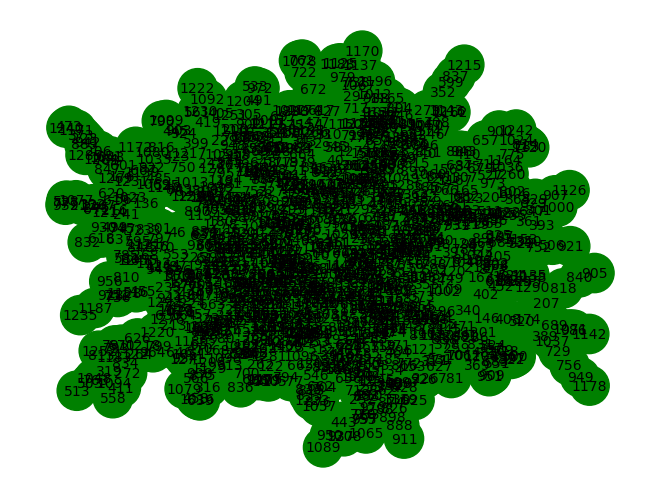

In [8]:
print("problem size", instance.size)
print("fire starts", instance.problem.fire_starts)
print("num teams", instance.problem.num_teams)
draw_graph(instance.problem.graph, instance.problem.fire_starts)

In [9]:
displayer = Displayer()
gene_displayer = GeneEvolutionRenderer()

## The Run

In [10]:
data = optimize_and_collect(instance)

[2025-02-05 23:40:32][  0]     0.67726660     0.67718482 {7429.00000000 24002.40600000 241794.00000000 29874.83012057}
[2025-02-05 23:40:33][  1]     1.24972105     0.57092977 {7431.00000000 24853.31200000 236597.00000000 29337.23084939}
[2025-02-05 23:40:33][  2]     1.84666491     0.59187794 {7428.00000000 25193.40800000 241775.00000000 30485.33933532}
[2025-02-05 23:40:34][  3]     2.40318060     0.55497527 {7431.00000000 23874.38400000 207798.00000000 25343.36518871}
[2025-02-05 23:40:35][  4]     2.99536777     0.59058285 {7428.00000000 23344.55200000 249494.00000000 28259.99158909}
[2025-02-05 23:40:35][  5]     3.57817411     0.58106732 {7432.00000000 24487.40800000 183284.00000000 26232.25450436}
[2025-02-05 23:40:36][  6]     4.19705224     0.61694884 {7426.00000000 24685.66000000 237880.00000000 30164.31314094}
[2025-02-05 23:40:36][  7]     4.77338672     0.57420516 {7429.00000000 25531.26000000 243074.00000000 28233.31302785}
[2025-02-05 23:40:37][  8]     5.35187840     0.

In [11]:
evaluator = Evaluators.MainEvaluator()
solutions = correct_solutions(instance, evaluator=evaluator)

## Results

In [12]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [323]:
[4, 8, 205]


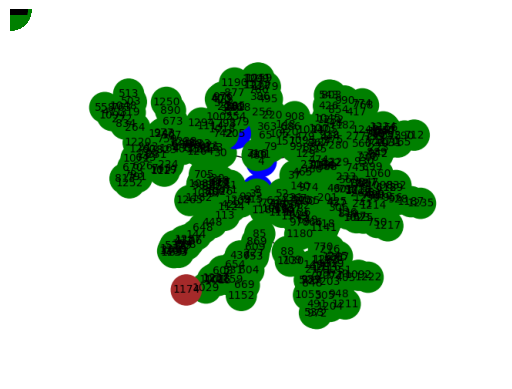

In [13]:
instance.problem.visualize_fire_without_burned(displayer, best_solution)

In [14]:
maybe_best_solution = [191, 274, 864]
evaluator(instance.problem, maybe_best_solution)

36

In [15]:
solutions

[([8, 258, 967], 181),
 ([8, 998, 1146], 177),
 ([8, 322, 622], 181),
 ([35, 215, 498], 155),
 ([8, 156, 721], 187),
 ([13, 33, 779], 136),
 ([8, 693, 1052], 178),
 ([8, 254, 369], 182),
 ([8, 920, 1179], 177),
 ([4, 111, 1057], 156),
 ([8, 313, 1010], 181),
 ([4, 74, 750], 141),
 ([8, 54, 594], 247),
 ([8, 78, 726], 192),
 ([13, 171, 1218], 130),
 ([4, 93, 230], 144),
 ([8, 1018, 1178], 179),
 ([8, 364, 382], 181),
 ([8, 855, 861], 178),
 ([8, 279, 1169], 182),
 ([8, 1003, 1055], 175),
 ([8, 708, 1004], 181),
 ([4, 128, 943], 139),
 ([8, 74, 458], 180),
 ([4, 23, 1000], 205),
 ([8, 950, 1011], 177),
 ([8, 405, 825], 176),
 ([13, 122, 250], 141),
 ([8, 957, 1290], 177),
 ([8, 470, 1021], 181),
 ([4, 24, 52], 265),
 ([8, 387, 410], 179),
 ([8, 828, 829], 177),
 ([8, 64, 555], 191),
 ([8, 235, 1235], 181),
 ([8, 979, 1217], 178),
 ([8, 919, 971], 177),
 ([8, 124, 959], 188),
 ([8, 174, 951], 191),
 ([8, 197, 1136], 181),
 ([8, 358, 1096], 176),
 ([4, 8, 618], 313),
 ([8, 138, 498], 181),

In [19]:
instance.problem.visualize_fires(displayer, solutions)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x73a16529dda0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

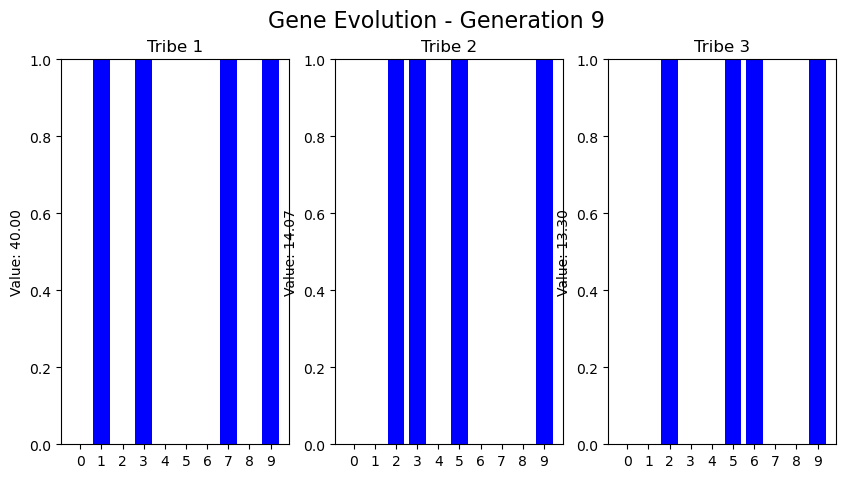

In [44]:
gene_displayer.visualize(data)

In [95]:
def collect_and_visualize(local_step_size):
    instance = Instance("problems/p6.json",
        evaluator=Evaluators.CummulativeEvaluator(),
        mutator=Mutators.WalkMutator(),
        generator=Generators.TruncatedNormal(),
        fixer=Fixers.ChoiceFixer(),
        weight_generator=WeightGenerators.SoftmaxWeights(),
        gene_mutator=GeneMutators.Normal(sigma=0.04))
    
    data = optimize_and_collect(instance,
                                tribe_number=4,
                                tribe_population=50,
                                number_of_iterations=200,
                                print_updates=False,
                                record_metrics=False,
                                local_step_size=local_step_size,
                                )
    print("data collected")
    visualize_gene_evolution(data)
    return gene_displayer.visualize(data)
    

data collected


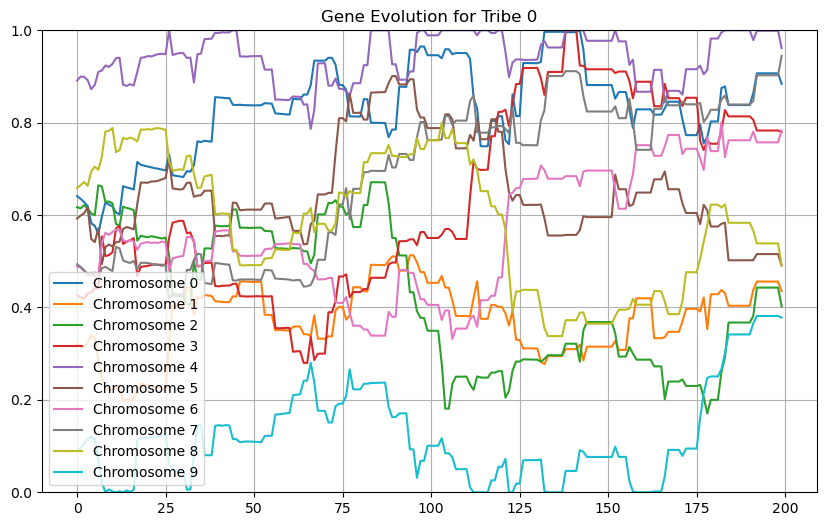

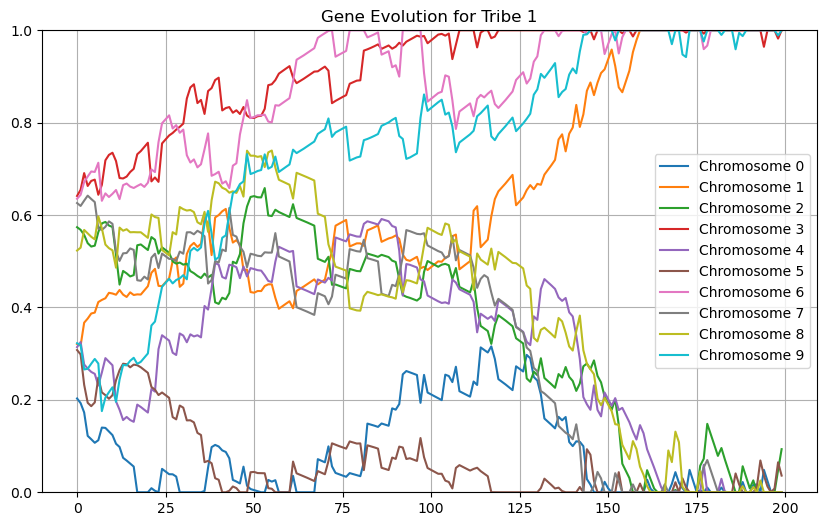

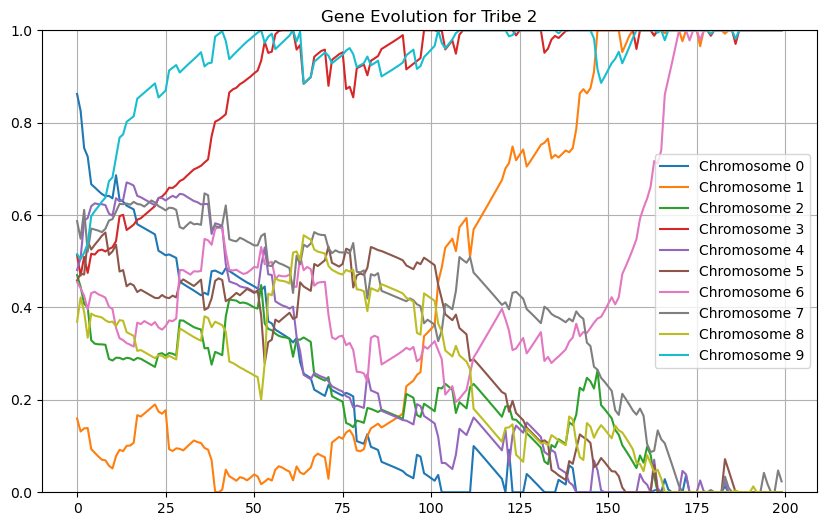

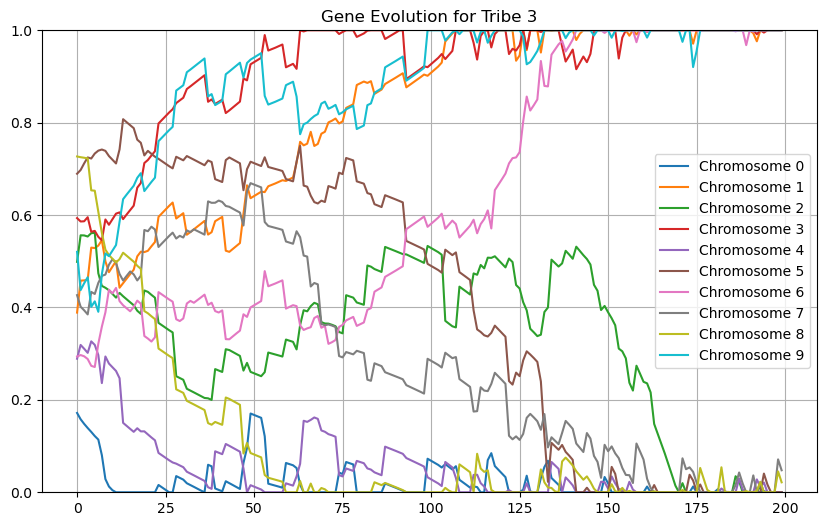

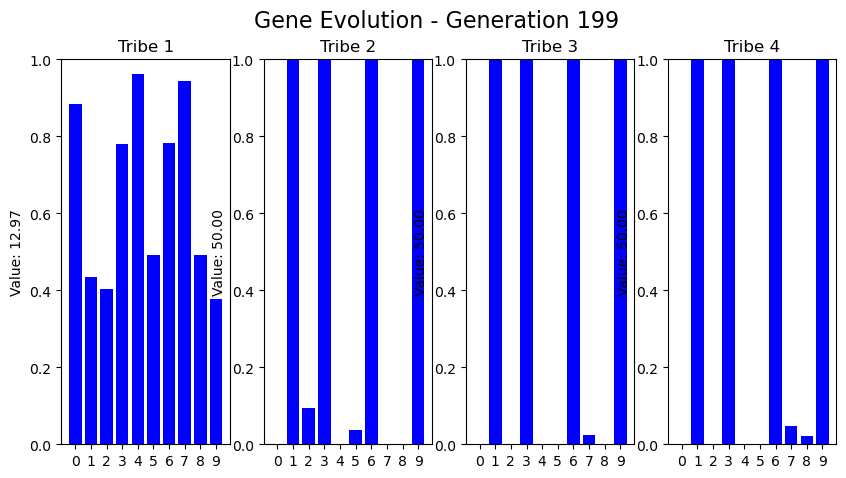

In [96]:
collect_and_visualize(0.03)

In [ ]:
instance

In [91]:
evaluator = Evaluators.MainEvaluator()
solutions = [ (np.where(bool_array)[0].tolist(), evaluator(instance.problem, bool_array)) for bool_array, _ in instance.solutions ]

## Results

In [92]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [5]:
[1, 3, 6, 9]
